In [95]:
import main_check_focus_exp as main
import sys
sys.path.append('/Users/qingjunwang/Documents/code/python')
import main_check_focus_exp as main
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
import re
import io
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import shift
import matplotlib.patches as patches


In [101]:
def shaking_scan_amplitude_laser_driving(dic_images_key_path, amplitude_arr, image_pixel_per_um, select_color_chan, color, img_save_path,crop_middle_third,anglearr):
    """"
    shaking simulation used for laser driving where I need arrs of shaking angle range
    Parameters:
        dic_images_key_path(dic): {orginal_img_name(str):path(str)}
        amplitude_arr(arr): 
        image_pixel_per_um(float):
        select_color_chan(int): 0/1 for either grayscale image or color image
        color(str): 'red', 'green','blue'
        img_save_path(str):full path, ending at '/', and the system will create it if not exist
        crop_middle_third(int):0/1 for either non-crop or crop
        anglearr(list of list): look like [[0.0, 240.0], [720.0, 960.0]], from 0-240 degree and from 720 degree to 960 degree
    return: contrast(dic,with tuple as dic key), contrast[(orginal_img_name,amplitude_arr[j])]=scaled_img.std()/scaled_img.mean()
    """
    contrast={}
    radius_arr = np.ceil([amp * image_pixel_per_um for amp in amplitude_arr]) #in pixel
    sampling_arr = [np.ceil(amp/30*100) for amp in amplitude_arr] #1.8um per sampling on the trajectory
    for i in range(len(sampling_arr)): #makesure enough sampling
        if sampling_arr[i]<30:
            sampling_arr[i]=30
    for orginal_img_name, path in dic_images_key_path.items():
        img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
        if img is None:
            print(f"Failed to load image at {path}")
            continue
        if len(img.shape) == 2:
            img1 = img.astype(np.float32)
        elif len(img.shape) == 3:
            if select_color_chan==1:
                color_map = {'red': 2, 'green': 1, 'blue': 0}
                if color in color_map:
                    img1 = img[:, :, color_map[color]].astype(np.float32)
                else:
                    print(f"Invalid color specified: {color}")
                    continue
            else:
                img1=img.astype(np.float32)
        else:
            print(f"Unsupported image format at {path}")
            continues
        if crop_middle_third==1:
            height, width = img1.shape
            left = width // 3
            top = height // 3
            right = 2 * width // 3
            bottom = 2 * height // 3
            img1 = img1[top:bottom, left:right]
        print("image loaded:",orginal_img_name)
        for j in range(len(amplitude_arr)):
            count_of_point=0
            sum_img = np.zeros_like(img1) #no constrain on the max value for each "pixel"
            if amplitude_arr[j]==0:
                avg_img=img1
            else:
                for anglelist in anglearr:
                    anglerange=anglelist[1]-anglelist[0]
                    # try:
                    #     angle = np.linspace(int(anglelist[0]), int(anglelist[1]), int(sampling_arr[j]*anglerange/360))
                    # except ValueError:
                    #     angle = np.linspace(int(anglelist[0]), int(anglelist[1]), int(360*anglerange/360))
                    try:
                        num_samples = max(int(sampling_arr[j] * anglerange / 360),10)
                        if num_samples <= 0:
                            raise ValueError("Number of samples must be positive.")
                        angle = np.linspace(int(anglelist[0]), int(anglelist[1]), num_samples)
                    except ValueError:
                        num_samples = max(int(360 * anglerange / 360), 10) 
                        angle = np.linspace(int(anglelist[0]), int(anglelist[1]), num_samples)
                    print("amp:",amplitude_arr[j],",angle.min:",min(angle), ",angle.max:",max(angle), ",angle num:",int(sampling_arr[j]*anglerange/360))
                    for a in angle:
                        x_shift = radius_arr[j] * (np.cos(a/180*np.pi)-1)
                        y_shift = radius_arr[j] * np.sin(a/180*np.pi)
                        print(f"x_shift is {x_shift}, y_shift is {y_shift},a in degree={a}")
                        if select_color_chan==1:
                            shifted_img = shift(img1, [y_shift, x_shift], mode="wrap")
                        else:
                            shifted_img = shift(img1, [y_shift, x_shift,0], mode="wrap")
                        sum_img += shifted_img
                        count_of_point+=1
                    print("finished one angle range")
                print("finished one angle array,for one amplitude")
                print(count_of_point)
                avg_img = sum_img /count_of_point
            scaled_img = main.normalize_255(avg_img)
            # scaled_img = main.normalize_255(avg_img,'green',0,"path")
            contrast[(orginal_img_name,amplitude_arr[j])]=scaled_img.std()/scaled_img.mean()
            fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))
            vmin = 0
            vmax = 255
            im1 = axs[0].imshow(img1, cmap="gray", vmin=vmin, vmax=vmax)
            axs[0].set_title("Original Image")
            fig.colorbar(im1, ax=axs[0])
            axs[0].grid(False)
            im2 = axs[1].imshow(scaled_img, cmap="gray", vmin=vmin, vmax=vmax)
            axs[1].set_title("Average of Images")
            fig.colorbar(im2, ax=axs[1])
            axs[1].grid(False)
            
            # #show trajectory
            # im3=axs[2].imshow(x, y, label='Circle')
            # axs[2].set_title("show trajectory")
            # axs[2].grid(False)
            # x = radius * np.cos(np.linspace(0, 2 * np.pi, 360))
            # y = radius * np.sin(np.linspace(0, 2 * np.pi, 360))
            # x_highlight = [radius_arr[j] * np.cos(a/180*np.pi) for a in angle]
            # y_highlight =  [radius_arr[j] * np.sin(a/180*np.pi) for a in angle]
            # # Plot the highlighted section
            # plt.fill_between(x_highlight, y_highlight, color='red', alpha=0.5, label='Angle Range')
            # Calculate coordinates for the full circle
            x = amplitude_arr[j] * np.cos(np.linspace(0, 2 * np.pi, 360))
            y = amplitude_arr[j] * np.sin(np.linspace(0, 2 * np.pi, 360))
            # Plot the full circle on the third subplot
            axs[2].plot(x, y, label='Circle', color='blue')
            axs[2].set_title("Show Trajectory, in um ")
            axs[2].axis('equal')  # Ensure the circle is not distorted
            axs[2].grid(False)  # Turn off the grid
            # x_highlight = amplitude_arr[j] * np.cos(np.radians(angle))
            # y_highlight = amplitude_arr[j] * np.sin(np.radians(angle))
            # # Plot the highlighted section
            # axs[2].fill_between(x_highlight, 0, y_highlight, color='red', alpha=0.5, label='Angle Range')
            wedge = patches.Wedge((0, 0), amplitude_arr[j], angle[0], angle[-1], color='red', alpha=0.5, label='Angle Range')
            axs[2].add_patch(wedge)
            axs[2].legend()
            plt.show()


            filename=f'{img_save_path}{orginal_img_name}_{int(sampling_arr[j])}points_{amplitude_arr[j]}um_contrast{contrast[(orginal_img_name,amplitude_arr[j])]}.png'
            directory = os.path.dirname(filename)
            if not os.path.exists(directory):
                os.makedirs(directory)
            success = cv2.imwrite(filename, scaled_img)
            if success:
                print(f"Image successfully saved to {filename}")
            else:
                print(f"Failed to save image to {filename}")
    return contrast

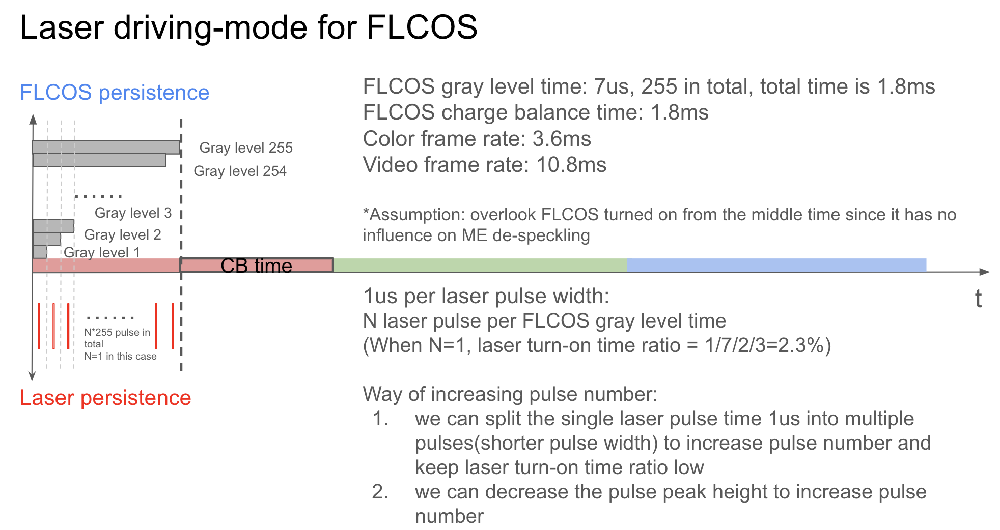

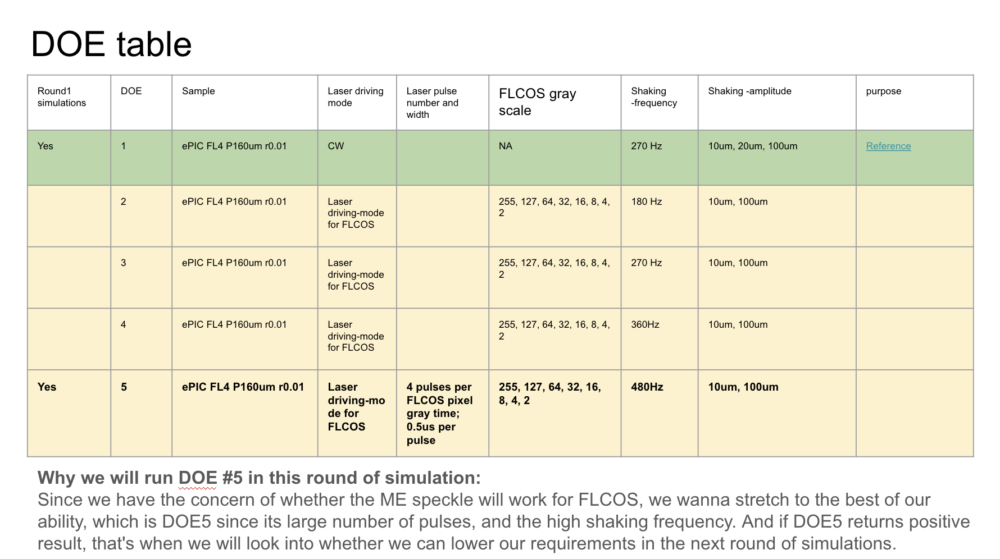

In [4]:
from IPython.display import display, Image

# Display an image file
display(Image(filename='/Users/qingjunwang/Documents/screenshots/part2 DOE laser driving.png', width=500, height=300))
# display(Image(filename='/Users/qingjunwang/Documents/screenshots/mode2.png', width=500, height=300))
display(Image(filename='/Users/qingjunwang/Documents/screenshots/part2 DOE table.png', width=500, height=300))

```python
Eye integration time: 60Hz

DOE5:
within one eye integration cycle,lets first consider mechanical shaking cycles:
    for shaking frequency 540Hz: 9 cycles

And for different shaking frequency with different cycle numbers, lets mark down the portion when FLCOS is tuned on in each frequency:

    for video frame rate = 90Hz, within one eye integration time, it has 1.5 cyles of video frame. 
    for DOEs with CB, within each cycle of video frame, there is only first 1/2*1/3 cycle the FLCOS could be on
```

# DOE5: ME cycle+ color frame rate

In [35]:
#CW mode1
def plot_shaking_and_laser_cycles_mode1(shaking_cycle,laser_cycle,laser_on_ratio,j):
    eye_integration_time = 1 / 60  # Eye integration frequency is 60Hz
    # shaking_cycle = 3  # Laser frequency is 90Hz
    # laser_cycle = 1.5  # Laser is on for the first 1/3 of each cycle
    shaking_total_angle=int(shaking_cycle*360) #in degree
    laser_cycle_angle_range=shaking_total_angle/laser_cycle
    i=0
    laser_on_angle_array=[]
    while laser_cycle_angle_range*i<shaking_total_angle:
        if (i+laser_on_ratio)*laser_cycle_angle_range<shaking_total_angle:
            laser_on_angle_array.append([i*laser_cycle_angle_range,(i+laser_on_ratio)*laser_cycle_angle_range])
        if (i+laser_on_ratio)*laser_cycle_angle_range>shaking_total_angle:
            laser_on_angle_array.append([i*laser_cycle_angle_range,shaking_total_angle])  
        i+=1
    print("angle range when laser turned on:", laser_on_angle_array)
    theta=np.array(range(0,shaking_total_angle,1))
    theta_in_rand=[x/180*np.pi for x in range(0,shaking_total_angle,1)]
    plt.figure(figsize=(4, 5))
    plt.title(f'Shaking frequency: {shaking_cycle*60}Hz, cycles of shaking:{shaking_cycle},graylevel:{j}')
    plt.plot(theta, np.sin(theta_in_rand), label='shaking Cycle', color='blue')
    for anglerange in laser_on_angle_array:
        where=(theta >= anglerange[0]) & (theta <= anglerange[1])
        plt.fill_between(theta, np.sin(theta_in_rand), where=where, color='yellow', alpha=0.5, label='Laser On')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.ylabel('circle x amplitude')
    plt.xlabel('shaking angle within one eye integration cycle')
    # theta_in_rad=theta_in_rand
    # fig, axs = plt.subplots(1, len(laser_on_angle_array), figsize=(15, 3))
    # for idx, anglerange in enumerate(laser_on_angle_array):
    #     axs[idx].plot(theta, np.sin(theta_in_rad), label='Shaking Cycle', color='blue')
    #     where = (theta >= anglerange[0]) & (theta <= anglerange[1])
    #     axs[idx].fill_between(theta, np.sin(theta_in_rad), where=where, color='red', alpha=0.5, label='Laser On')
    #     axs[idx].set_title(f'Laser On: {anglerange[0]}° to {anglerange[1]}°')
    #     axs[idx].set_xlabel('Shaking angle (degrees)')
    #     if idx == 0:
    #         axs[idx].set_ylabel('Circle x amplitude')
    #     axs[idx].legend()
    # plt.tight_layout()
    # plt.show()

    return laser_on_angle_array



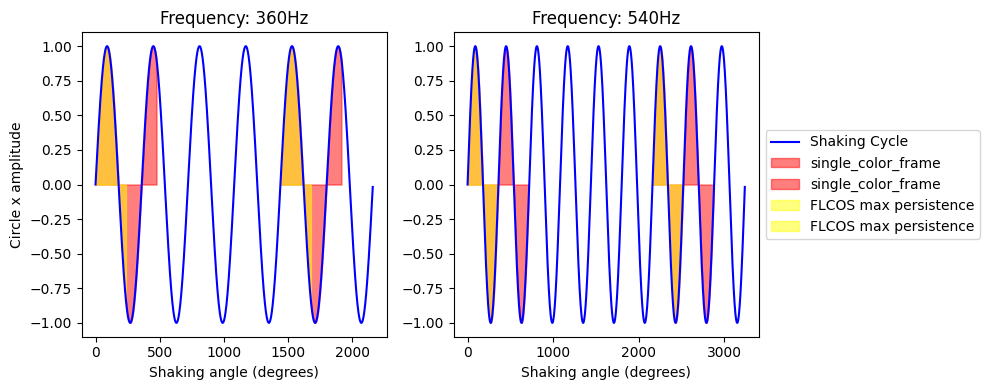

In [24]:
import numpy as np
import matplotlib.pyplot as plt

def plot_shaking_and_laser_cycles(shaking_frequencies, laser_cycle, laser_on_ratio):
    eye_integration_time = 1 / 60  # Eye integration frequency is 60Hz

    # Create a figure with subplots in one row, one for each frequency
    fig, axs = plt.subplots(1, len(shaking_frequencies), figsize=(5 * len(shaking_frequencies), 4))

    for idx, shaking_cycle in enumerate(shaking_frequencies):
        shaking_total_angle = int(shaking_cycle * 360)  # in degrees
        laser_cycle_angle_range = shaking_total_angle / laser_cycle

        i = 0
        laser_on_angle_array = []

        # Calculate the angle ranges where the laser is turned on
        while laser_cycle_angle_range * i < shaking_total_angle:
            start_angle = i * laser_cycle_angle_range
            end_angle = (i + laser_on_ratio) * laser_cycle_angle_range

            if end_angle < shaking_total_angle:
                laser_on_angle_array.append([start_angle, end_angle])
            else:
                laser_on_angle_array.append([start_angle, shaking_total_angle])
                break  # Exit the loop if the end angle exceeds the total angle

            i += 1

        theta = np.arange(0, shaking_total_angle, 1)
        theta_in_rad = theta / 180 * np.pi

        # Plot shaking cycle and laser on periods
        axs[idx].plot(theta, np.sin(theta_in_rad), label='Shaking Cycle', color='blue')
        for anglerange in laser_on_angle_array:
            where = (theta >= anglerange[0]) & (theta <= anglerange[1])
            axs[idx].fill_between(theta, np.sin(theta_in_rad), where=where, color='red', alpha=0.5, label='single_color_frame')
        for anglerange in laser_on_angle_array:
            start_angle = anglerange[0]
            end_angle = anglerange[1]
            mid_angle = start_angle + (end_angle - start_angle) / 2  # Calculate the midpoint of the angle range
            where = (theta >= start_angle) & (theta <= mid_angle)  # Adjust the condition to cover the first half of the red section
            axs[idx].fill_between(theta, np.sin(theta_in_rad), where=where, color='yellow', alpha=0.5, label='FLCOS max persistence')
        axs[idx].set_title(f'Frequency: {shaking_cycle * 60}Hz')
        axs[idx].set_xlabel('Shaking angle (degrees)')
        if idx == 0:
            axs[idx].set_ylabel('Circle x amplitude')
        if idx == 1:
            axs[idx].legend(loc='center left', bbox_to_anchor=(1, 0.5))

    plt.tight_layout()
    plt.show()

# Example usage with different frequencies
shaking_frequencies = [6,9]  # Different shaking cycles corresponding to different frequencies
laser_cycle = 1.5
laser_on_ratio = 1/3 #FLCOS max on ratio for part2 study
plot_shaking_and_laser_cycles(shaking_frequencies, laser_cycle, laser_on_ratio)

angle range when laser turned on: [[0.0, 360.0], [2160.0, 2520.0]]
angle range when laser turned on: [[0.0, 179.2941176470588], [2160.0, 2339.2941176470586]]
angle range when laser turned on: [[0.0, 90.35294117647058], [2160.0, 2250.3529411764707]]
angle range when laser turned on: [[0.0, 45.17647058823529], [2160.0, 2205.176470588235]]
angle range when laser turned on: [[0.0, 22.588235294117645], [2160.0, 2182.5882352941176]]
angle range when laser turned on: [[0.0, 11.294117647058822], [2160.0, 2171.2941176470586]]
angle range when laser turned on: [[0.0, 5.647058823529411], [2160.0, 2165.6470588235293]]
angle range when laser turned on: [[0.0, 2.8235294117647056], [2160.0, 2162.823529411765]]


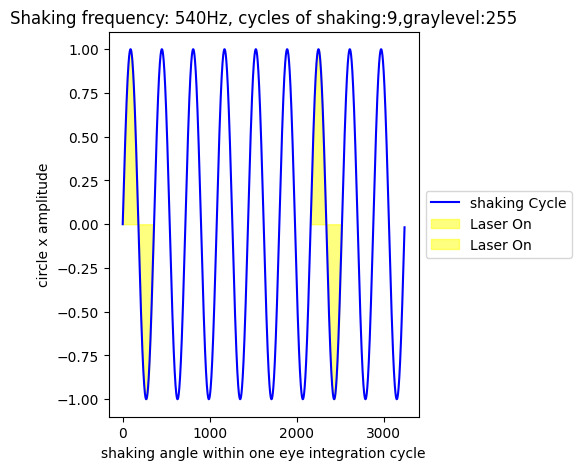

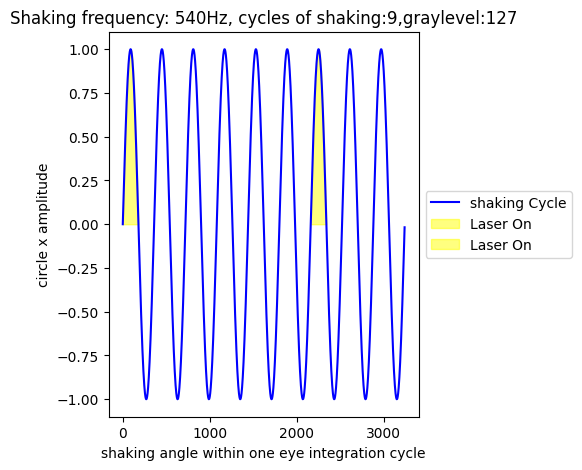

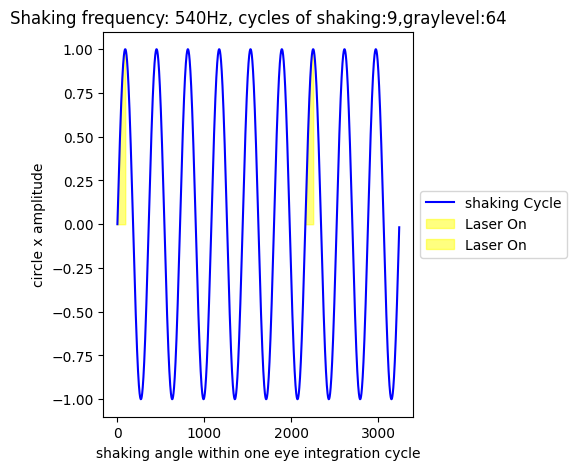

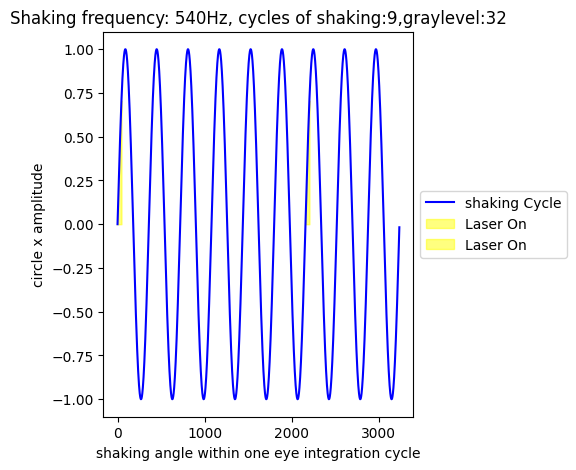

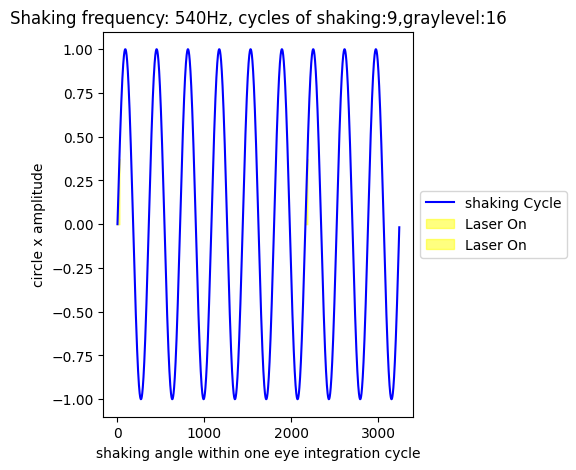

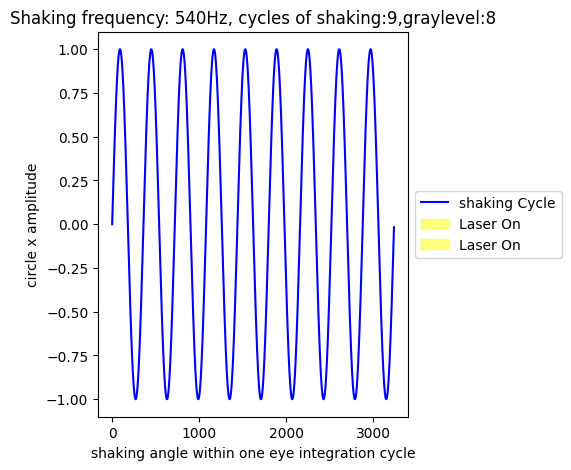

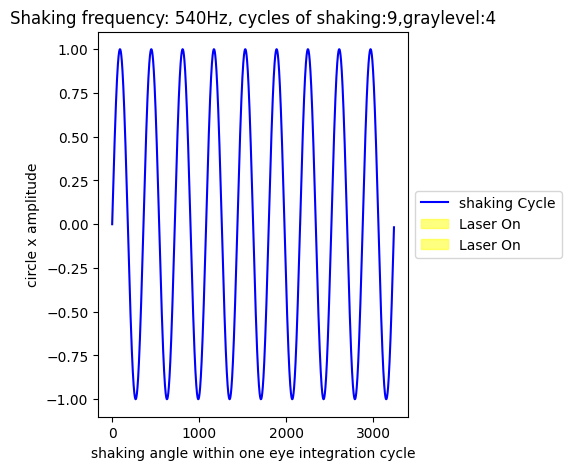

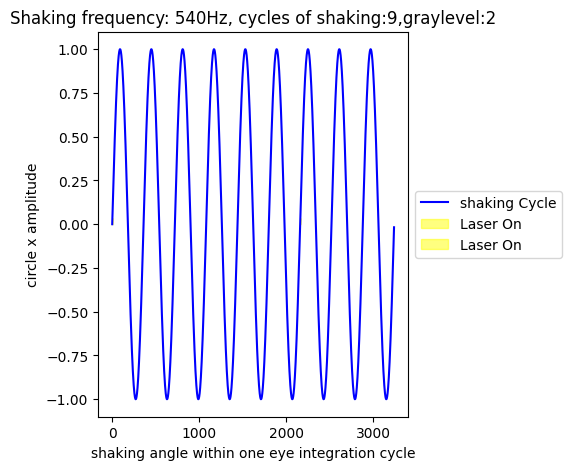

In [36]:
# laser_on_angle_array=plot_shaking_and_laser_cycles_mode1(3,1.5,1/3)
# laser_on_angle_array=plot_shaking_and_laser_cycles_mode1(4.5,1.5,1/3)
# laser_on_angle_array=plot_shaking_and_laser_cycles_mode1(6,1.5,1/3)
# laser_on_angle_array=plot_shaking_and_laser_cycles_mode1(8,1.5,1/3)
graylevel=[255, 127, 64, 32, 16, 8, 4, 2]
for i in graylevel:
    laser_on_angle_array=plot_shaking_and_laser_cycles_mode1(9,1.5,1/6*i/255,i)


In [147]:
?shaking_scan_amplitude_laser_driving

Signature:
shaking_scan_amplitude_laser_driving(
    dic_images_key_path,
    amplitude_arr,
    image_pixel_per_um,
    select_color_chan,
    color,
    img_save_path,
    crop_middle_third,
    anglearr,
)
Docstring:
"
shaking simulation used for laser driving where I need arrs of shaking angle range
Parameters:
    dic_images_key_path(dic): {orginal_img_name(str):path(str)}
    amplitude_arr(arr): 
    image_pixel_per_um(float):
    select_color_chan(int): 0/1 for either grayscale image or color image
    color(str): 'red', 'green','blue'
    img_save_path(str):full path, ending at '/', and the system will create it if not exist
    crop_middle_third(int):0/1 for either non-crop or crop
    anglearr(list of list): look like [[0.0, 240.0], [720.0, 960.0]], from 0-240 degree and from 720 degree to 960 degree
return: contrast(dic,with tuple as dic key), contrast[(orginal_img_name,amplitude_arr[j])]=scaled_img.std()/scaled_img.mean()
File:      /var/folders/0r/tf9tj8xj6t986pfvvhtz7f5c0

## load image and check size

In [51]:
from PIL import Image
path='/Users/qingjunwang/Documents/image files/FLCOS laser driving simulation/160X80 #27 simulation_0points_0um_contrast0.19058443961429433.png'
image = Image.open(path)
width, height = image.size
print(f"The image dimensions are {width}x{height} pixels.")

The image dimensions are 820x820 pixels.


image loaded: ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray16
amp: 10 ,angle.min: 0.0 ,angle.max: 22.0 ,angle num: 2
x_shift is 0.0, y_shift is 0.0,a in degree=0.0
x_shift is -0.018199070288216213, y_shift is 0.8530132504066128,a in degree=2.4444444444444446
x_shift is -0.07276316053692611, y_shift is 1.7044740960031326,a in degree=4.888888888888889
x_shift is -0.16359296917476618, y_shift is 2.5528329572118924,a in degree=7.333333333333334
x_shift is -0.29052319439456964, y_shift is 3.396545899778414,a in degree=9.777777777777779
x_shift is -0.45332283498728865, y_shift is 4.234077444588215,a in degree=12.222222222222223
x_shift is -0.6516956107427219, y_shift is 5.063903362096035,a in degree=14.666666666666668
x_shift is -0.8852805016519416, y_shift is 5.884513446281904,a in degree=17.111111111111114
x_shift is -1.1536524049301566, y_shift is 6.694414263085688,a in degree=19.555555555555557
x_shift is -1.4563229086642515, y_shift is 7.49213186831824,a in degree=22.0
finished one angle range


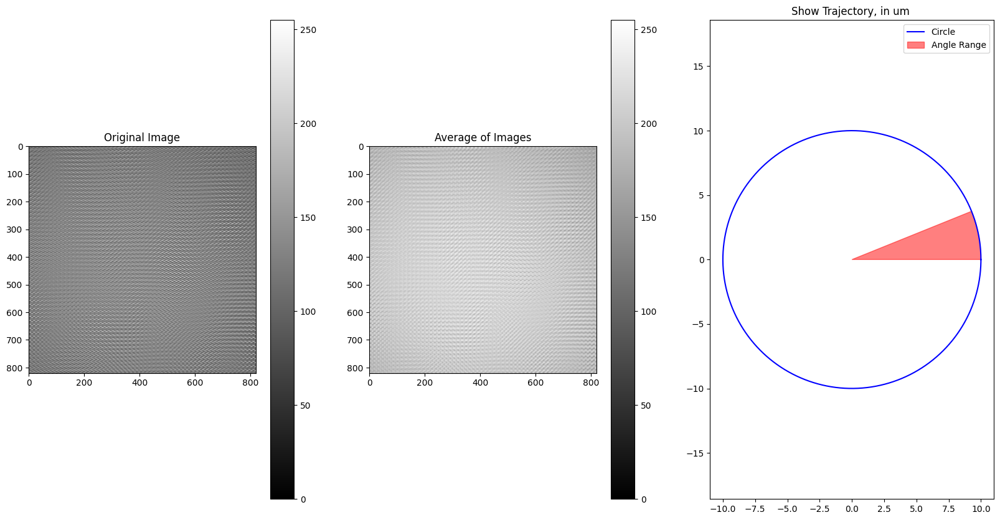

Image successfully saved to /Users/qingjunwang/Documents/image files/FLCOS laser driving simulation/ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray16_34points_10um_contrast0.07246731248409523.png
amp: 100 ,angle.min: 0.0 ,angle.max: 22.0 ,angle num: 20
x_shift is 0.0, y_shift is 0.0,a in degree=0.0
x_shift is -0.04083928350790966, y_shift is 4.041539998081086,a in degree=1.1578947368421053
x_shift is -0.16334045556090082, y_shift is 8.08142946018427,a in degree=2.3157894736842106
x_shift is -0.36745348755797824, y_shift is 12.118018524398718,a in degree=3.473684210526316
x_shift is -0.6530950211993458, y_shift is 16.149658676672445,a in degree=4.631578947368421
x_shift is -1.020148402529264, y_shift is 20.174703424053643,a in degree=5.7894736842105265
x_shift is -1.4684637295766967, y_shift is 24.19150896710661,a in degree=6.947368421052632
x_shift is -1.9978579135742525, y_shift is 28.198434871227658,a in degree=8.105263157894736
x_shift is -2.6081147537302174, y_shift is 32.193844736586854,a i

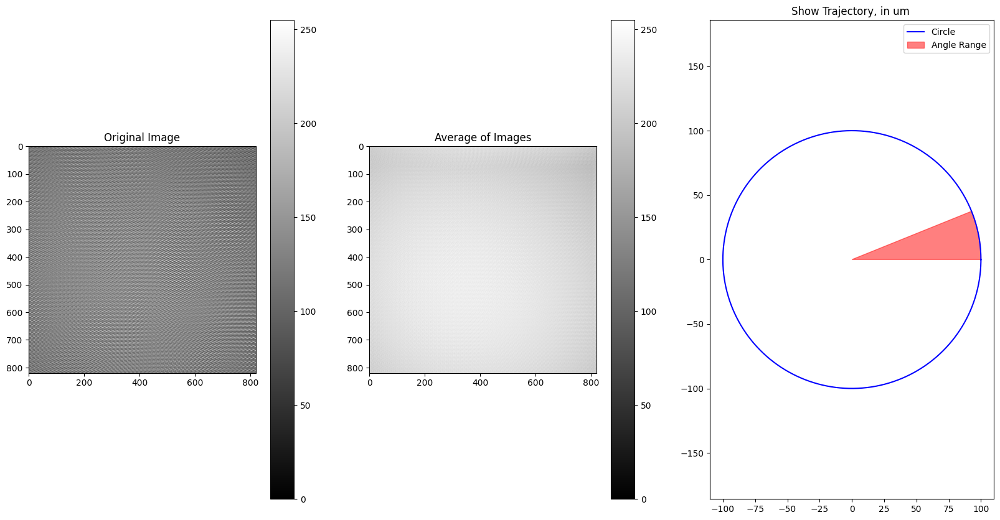

Image successfully saved to /Users/qingjunwang/Documents/image files/FLCOS laser driving simulation/ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray16_334points_100um_contrast0.048588020711153514.png


In [114]:
#shaking simulation

#full image:
# path="/Users/qingjunwang/Documents/image files/speckle 2 study/yuhang/YSSI_P20(XP10_YP20)_rSD_Green_single_image_folder/EPIC_FL2_D12C5_YSSI_P20_rSD_Green_50mA_25degrees_X0.000_Y0.000_Z33.606_Exp35938.png"

#small image:
path='/Users/qingjunwang/Documents/image files/FLCOS laser driving simulation/160X80 #27 simulation_0points_0um_contrast0.19058443961429433.png'
i=16
dic_images_key_path={f"ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray{i}":path}
amplitude_arr=[10,100]
image_pixel_per_um=4096/2050 #simulation of FL4
select_color_chan=1
color='green'
img_save_path='/Users/qingjunwang/Documents/image files/FLCOS laser driving simulation/'
crop_middle_third=0
anglearr=[[0.0, (360.0/255)*i]]
contrast=shaking_scan_amplitude_laser_driving(dic_images_key_path, amplitude_arr, image_pixel_per_um, select_color_chan, color, img_save_path,crop_middle_third,anglearr)

In [115]:
import os
from PIL import Image
import numpy as np

def load_images_from_folder(folder):
    images = []
    filenames = []
    for filename in os.listdir(folder):
        img = Image.open(os.path.join(folder, filename)).convert('RGB')
        if img is not None:
            images.append(img)
            filenames.append(filename)
    return images, filenames

def find_lowest_avg_pixel_value(images):
    min_avg_value = float('inf')
    min_index = -1
    for i, img in enumerate(images):
        np_img = np.array(img)
        avg_value = np.mean(np_img)
        if avg_value < min_avg_value:
            min_avg_value = avg_value
            min_index = i
    return min_avg_value, min_index

def normalize_images(images, target_avg):
    normalized_images = []
    for img in images:
        np_img = np.array(img)
        current_avg = np.mean(np_img)
        factor = target_avg / current_avg
        normalized_img = Image.fromarray(np.clip(np_img * factor, 0, 255).astype(np.uint8))
        normalized_images.append(normalized_img)
    return normalized_images

def save_images(images, filenames, folder):
    if not os.path.exists(folder):
        os.makedirs(folder)
    for img, filename in zip(images, filenames):
        img.save(os.path.join(folder, filename))

# Define the folder path containing images
folder_path = '/Users/qingjunwang/Documents/image files/FLCOS laser driving simulation/grayscale'

images, filenames = load_images_from_folder(folder_path)

lowest_avg_value, lowest_index = find_lowest_avg_pixel_value(images)

normalized_images = normalize_images(images, lowest_avg_value)

output_folder = os.path.join(folder_path, 'normalized_images')
save_images(normalized_images, filenames, output_folder)

print("Images have been normalized and saved successfully.")

Images have been normalized and saved successfully.


## Extract information from images and draw line

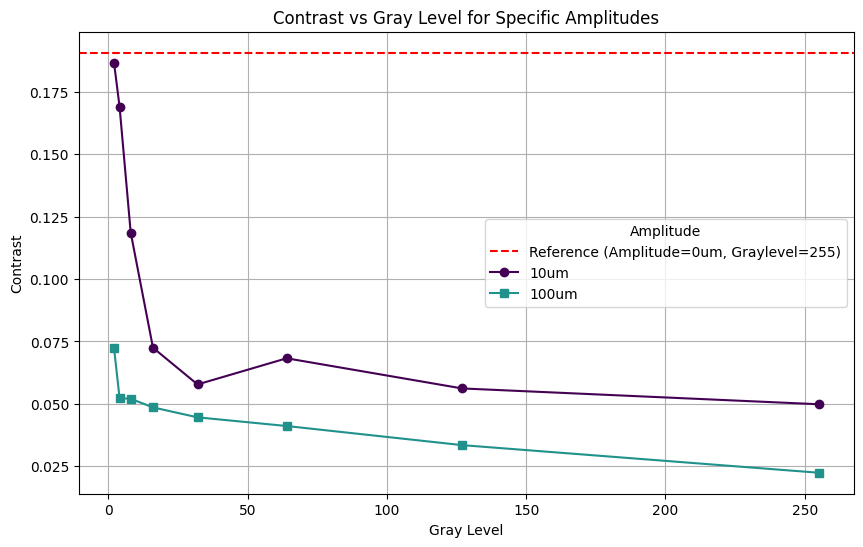

    Amplitude Gray Level  Contrast
0           0         NA  0.190584
1          10          2  0.186656
2          10          4  0.168928
3          10          8  0.118558
4          10         16  0.072467
5          10         32  0.057781
6          10         64  0.068253
7          10        127  0.056181
8          10        255  0.049855
9         100          2  0.072470
10        100          4  0.052274
11        100          8  0.052035
12        100         16  0.048588
13        100         32  0.044609
14        100         64  0.041136
15        100        127  0.033483
16        100        255  0.022436


In [127]:
import os
import re
import matplotlib.pyplot as plt
import pandas as pd

def extract_info_from_filenames(folder):
    data = {}
    for filename in os.listdir(folder):
        match = re.match(r'.*gray(\d+)_.*_(\d+)um_contrast([\d.]+)\.png', filename)
        if match:
            gray_level = int(match.group(1))
            amplitude = int(match.group(2))
            contrast = float(match.group(3))
            key = amplitude  # Use amplitude as the key
            if key not in data:
                data[key] = []
            data[key].append((gray_level, contrast))
    return data

def plot_data(data, specific_amplitudes, reference_contrast):
    plt.figure(figsize=(10, 6))
    colors = plt.cm.viridis(np.linspace(0, 1, len(specific_amplitudes) + 1))  # Color map
    markers = ['o', 's', '^', 'p', '*', 'x', '+']  # Marker styles

    # Plot reference line
    plt.axhline(y=reference_contrast, color='r', linestyle='--', label='Reference (Amplitude=0um, Graylevel=255)')

    for i, amplitude in enumerate(specific_amplitudes):
        if amplitude in data:
            values = sorted(data[amplitude], key=lambda x: x[0])  # Sort by gray level
            gray_levels, contrasts = zip(*values)
            plt.plot(gray_levels, contrasts, label=f'{amplitude}um', color=colors[i], marker=markers[i % len(markers)])

    plt.xlabel('Gray Level')
    plt.ylabel('Contrast')
    plt.title('Contrast vs Gray Level for Specific Amplitudes')
    plt.legend(title='Amplitude')
    plt.grid(True)
    plt.show()

def print_table(data, reference_point):
    flat_list = [(amp, gray, cont) for amp, values in data.items() for gray, cont in values]
    # Append the reference point to the list
    flat_list.append((0, 'NA', reference_point))  # Amplitude=0um, Graylevel=255, Contrast=reference_point
    sorted_list = sorted(flat_list, key=lambda x: (x[0], x[1]))  # Sort by amplitude, then gray level
    df = pd.DataFrame(sorted_list, columns=['Amplitude', 'Gray Level', 'Contrast'])
    print(df)

def main():
    folder_path ='/Users/qingjunwang/Documents/image files/FLCOS laser driving simulation/grayscale/normalized_images'  # Update this path to your specific folder
    data = extract_info_from_filenames(folder_path)
    specific_amplitudes = [10, 100]  # Define specific amplitudes you want to plot
    reference_contrast = 0.19058443961429433  # Reference contrast value for amplitude=0um, graylevel=255
    plot_data(data, specific_amplitudes, reference_contrast)
    print_table(data, reference_contrast)

if __name__ == "__main__":
    main()




## Scale based on the gray level of the simulation

In [8]:
import os
from PIL import Image
import numpy as np

def adjust_image_intensity(image, scale_factor):
    """ Adjust the image intensity by multiplying by scale factor """
    adjusted_image_array = (np.array(image) * scale_factor).astype(np.uint8)
    adjusted_image = Image.fromarray(adjusted_image_array)
    return adjusted_image, np.mean(adjusted_image_array)

def extract_gray_level(filename):
    """ Extract the gray level from the filename """
    parts = filename.split('_')
    for part in parts:
        if part.startswith('gray'):
            return int(part[4:])
    return None

def process_images(folder_path):
    baseline_image = None
    baseline_mean = None
    image_files = []
    results = []
    
    # Create a subfolder to save adjusted images
    save_folder = os.path.join(folder_path, 'adjusted_images')
    os.makedirs(save_folder, exist_ok=True)
    
    # Collect all image files first
    for filename in os.listdir(folder_path):
        if filename.endswith('.png'):
            image_files.append(filename)
        else:
            print(f"Skipping {filename}, not a PNG file.")

    # Process to find the baseline image
    for filename in image_files:
        gray_level = extract_gray_level(filename)
        if gray_level == 255:
            image_path = os.path.join(folder_path, filename)
            baseline_image = Image.open(image_path)
            baseline_mean = np.mean(np.array(baseline_image))
            baseline_image.save(os.path.join(save_folder, filename))
            results.append((255, baseline_mean))
            print(f"Processed baseline image {filename} with gray level 255. Mean: {baseline_mean}")
            break

    # Check if baseline image was found
    if baseline_mean is None:
        print("No baseline image with gray level 255 found. Cannot adjust other images.")
        return

    # Process other images
    for filename in image_files:
        gray_level = extract_gray_level(filename)
        if gray_level != 255:
            scale_factor = gray_level / 255
            image_path = os.path.join(folder_path, filename)
            image = Image.open(image_path)
            adjusted_image, adjusted_mean = adjust_image_intensity(image, scale_factor)
            adjusted_image.save(os.path.join(save_folder, filename))
            results.append((gray_level, adjusted_mean))
            print(f"Processed adjusted image {filename} with scale factor {scale_factor}. Adjusted mean: {adjusted_mean}")

    # Sort results by gray level in descending order and print
    results.sort(reverse=True, key=lambda x: x[0])
    for gray_level, mean in results:
        print(f"Gray level: {gray_level}, Mean intensity: {mean}")
# Usage
folder_path = '/Users/qingjunwang/Documents/image files/FLCOS laser driving simulation/grayscale/mimic grayscale'
process_images(folder_path)


Skipping .DS_Store, not a PNG file.
Skipping adjusted_images, not a PNG file.
Skipping adjusted_images old, not a PNG file.
Processed baseline image ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray255_34points_10um_contrast0.04985499446429657.png with gray level 255. Mean: 217.32263533610947
Processed adjusted image ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray16_34points_10um_contrast0.07246731248409523.png with scale factor 0.06274509803921569. Adjusted mean: 12.073845925044616
Processed adjusted image ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray2_34points_10um_contrast0.18665606810431504.png with scale factor 0.00784313725490196. Adjusted mean: 0.520756989886972
Processed adjusted image ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray8_34points_10um_contrast0.11855785179373972.png with scale factor 0.03137254901960784. Adjusted mean: 4.959686198691255
Processed adjusted image ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray32_34points_10um_contrast0.05778087389468141.png with scale factor 0.12549019607843137. Adjusted mean: 26.31

In [9]:
folder_path = '/Users/qingjunwang/Documents/image files/FLCOS laser driving simulation/grayscale/mimic grayscale 100um'
process_images(folder_path)

Skipping adjusted_images, not a PNG file.
Processed baseline image ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray255_334points_100um_contrast0.022436483532562692.png with gray level 255. Mean: 237.45588637715645
Processed adjusted image ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray16_334points_100um_contrast0.048588020711153514.png with scale factor 0.06274509803921569. Adjusted mean: 13.43303242117787
Processed adjusted image ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray32_334points_100um_contrast0.04460861962252805.png with scale factor 0.12549019607843137. Adjusted mean: 27.987925342058297
Processed adjusted image ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray64_334points_100um_contrast0.041135566867759384.png with scale factor 0.25098039215686274. Adjusted mean: 56.45621207614515
Processed adjusted image ePIC_FL4_160um_r0.01_z1.5mm_DOE5_gray4_334points_100um_contrast0.05227407917310443.png with scale factor 0.01568627450980392. Adjusted mean: 2.9896475312314097
Processed adjusted image ePIC_FL4_160um_r0.01_z1.5mm_D

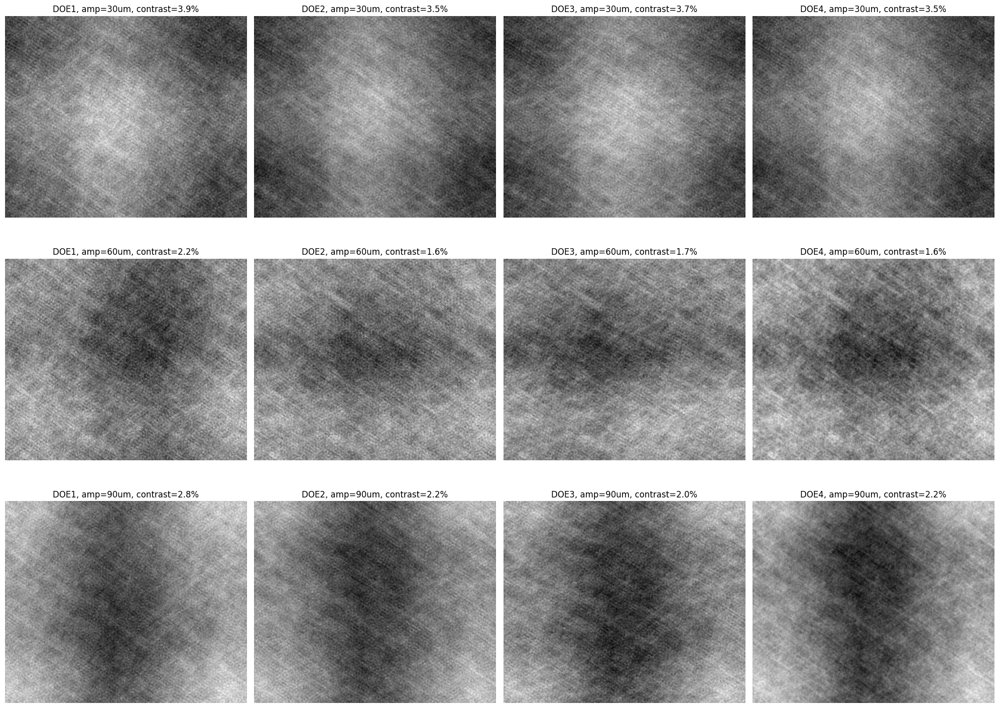

In [75]:
import os
import re
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def load_images_from_folder(folder):
    images = {}
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
            img = Image.open(os.path.join(folder, filename))
            if img is not None:
                # Extract details from filename
                match = re.search(r"DOE(\d+).*?(\d+)um_contrast([0-9.]+)", filename)
                if match:
                    doe = int(match.group(1))
                    amplitude = int(match.group(2))
                    contrast = float(match.group(3).rstrip('.'))
                    contrast_percentage = round(contrast * 100, 1)  # Convert to percentage and round
                    key = (doe, amplitude, contrast_percentage)
                    images[key] = np.array(img)
    return images

def normalize_images(images):
    # Find the minimum mean value among all images
    min_mean = min(np.mean(img) for img in images.values())
    
    # Normalize images to have the same mean value
    normalized_images = {key: img * (min_mean / np.mean(img)) for key, img in images.items()}
    return normalized_images

def save_normalized_images(images, folder_path):
    for key, img in images.items():
        doe, amplitude, contrast = key
        filename = f"DOE{doe}_amp{amplitude}um_contrast{contrast}%.png"
        Image.fromarray(img.astype('uint8')).save(os.path.join(folder_path, filename))

def plot_images(images):
    # Determine the layout of the subplots
    does = sorted(set(key[0] for key in images.keys()))
    amplitudes = sorted(set(key[1] for key in images.keys()))
    
    fig, axs = plt.subplots(len(amplitudes), len(does), figsize=(5 * len(does), 5 * len(amplitudes)))
    
    for i, amp in enumerate(amplitudes):
        for j, doe in enumerate(does):
            ax = axs[i, j] if len(amplitudes) > 1 else axs[j]
            key = next((k for k in images if k[0] == doe and k[1] == amp), None)
            if key:
                ax.imshow(images[key], cmap='gray')
                ax.set_title(f"DOE{doe}, amp={amp}um, contrast={key[2]}%")
                ax.axis('off')
            else:
                ax.axis('off')  # Turn off axis for empty subplots
    
    plt.tight_layout()
    plt.show()



folder_path = '/Users/qingjunwang/Documents/image files/laser driving simulation/doe1-4'
images = load_images_from_folder(folder_path)
normalized_images = normalize_images(images)
folder_path2 = '/Users/qingjunwang/Documents/image files/laser driving simulation/doe1-4/normalize'
save_normalized_images(normalized_images, folder_path2)  # Save each normalized image
plot_images(normalized_images)

```python
if within single laser on time, it covers more than one shaking cycle,means the laser turn-on time is not the bottleneck anymore

and we hope the laser turn on time can cover integer*mechanical shaking period, to give us best mechanical despeckling performance
```

# DOE5-7: 2% mode1 image for different cycles

angle range when laser turned on: [[0.0, 4.800000000000001], [720.0, 724.8]]
angle range when laser turned on: [[0.0, 7.2], [1080.0, 1087.1999999999998]]
angle range when laser turned on: [[0.0, 9.600000000000001], [1440.0, 1449.6]]
angle range when laser turned on: [[0.0, 12.8], [1920.0, 1932.8]]


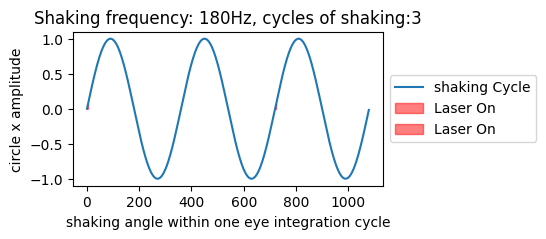

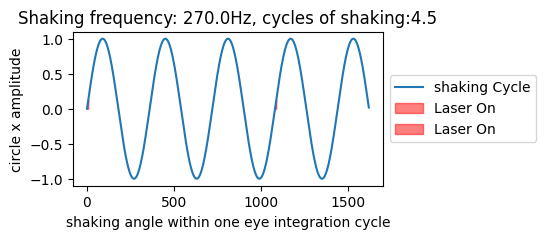

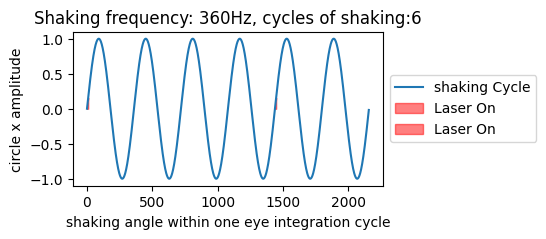

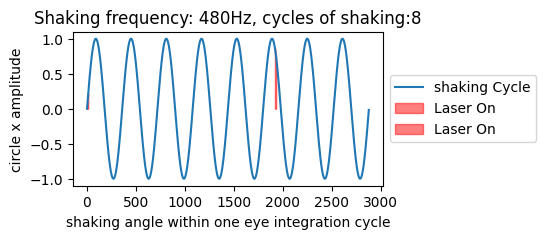

In [78]:
laser_on_angle_array=plot_shaking_and_laser_cycles_mode1(3,1.5,0.02*1/3)
laser_on_angle_array=plot_shaking_and_laser_cycles_mode1(4.5,1.5,0.02*1/3)
laser_on_angle_array=plot_shaking_and_laser_cycles_mode1(6,1.5,0.02*1/3)
laser_on_angle_array=plot_shaking_and_laser_cycles_mode1(8,1.5,0.02*1/3)

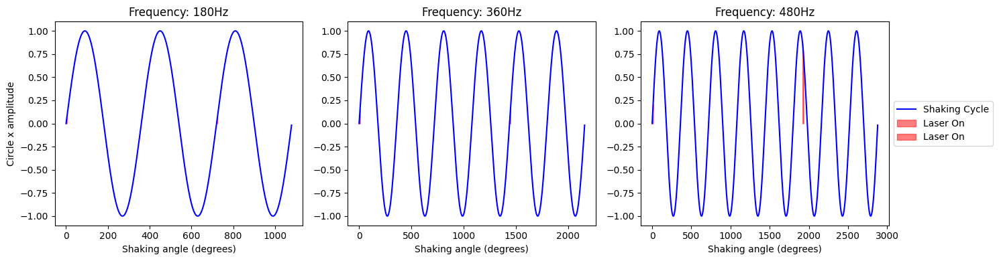

In [81]:
# Example usage with different frequencies
shaking_frequencies = [3, 6, 8]  # Different shaking cycles corresponding to different frequencies
laser_cycle = 1.5
laser_on_ratio = 0.33*0.02
plot_shaking_and_laser_cycles(shaking_frequencies, laser_cycle, laser_on_ratio)

In [101]:
x=100*np.tan(12/180*np.pi) #in um
print(x, 'um')

21.25565616700221 um


image loaded: ePIC_FL2_20um_r0.05_z2mm_DOE5
amp: 30 ,angle.min: 0.0 ,angle.max: 0.0 ,angle num: 1
finished one angle range
amp: 30 ,angle.min: 720.0 ,angle.max: 720.0 ,angle num: 1
finished one angle range
finished one angle array,for one amplitude
2


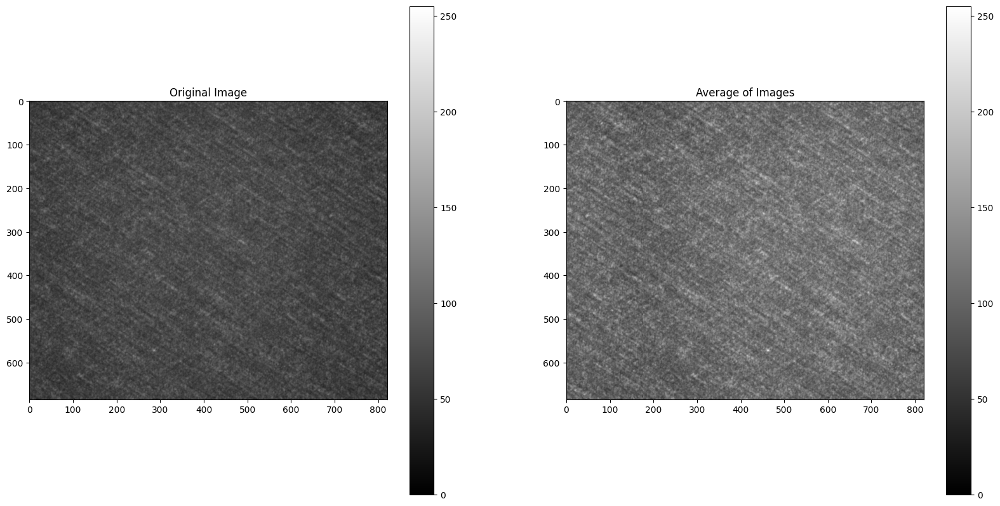

Image successfully saved to /Users/qingjunwang/Documents/image files/laser driving simulation/ePIC_FL2_20um_r0.05_z2mm_DOE5_100points_30um_contrast0.15735279183579873.png
amp: 60 ,angle.min: 0.0 ,angle.max: 4.0 ,angle num: 2
finished one angle range
amp: 60 ,angle.min: 720.0 ,angle.max: 724.0 ,angle num: 2
finished one angle range
finished one angle array,for one amplitude
4


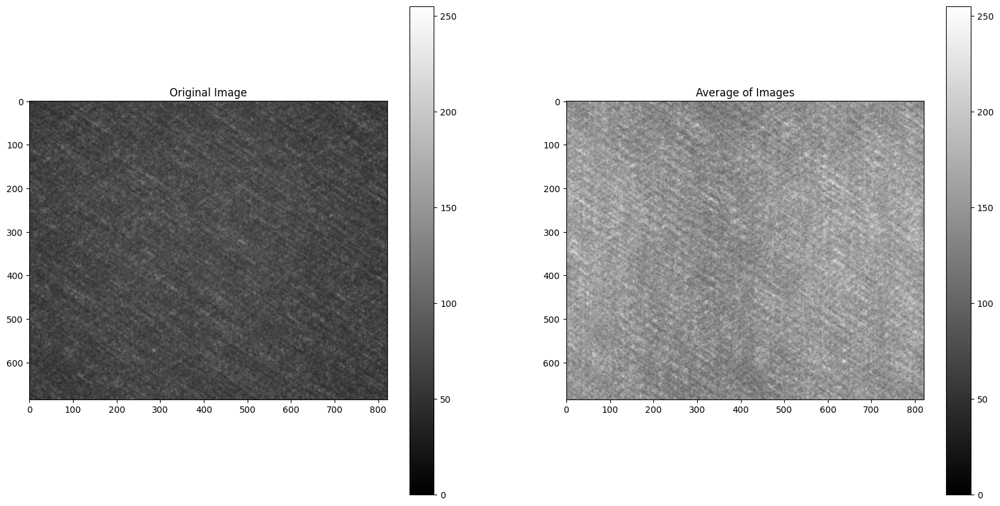

Image successfully saved to /Users/qingjunwang/Documents/image files/laser driving simulation/ePIC_FL2_20um_r0.05_z2mm_DOE5_200points_60um_contrast0.11835470702664357.png
amp: 90 ,angle.min: 0.0 ,angle.max: 4.0 ,angle num: 4
finished one angle range
amp: 90 ,angle.min: 720.0 ,angle.max: 724.0 ,angle num: 3
finished one angle range
finished one angle array,for one amplitude
7


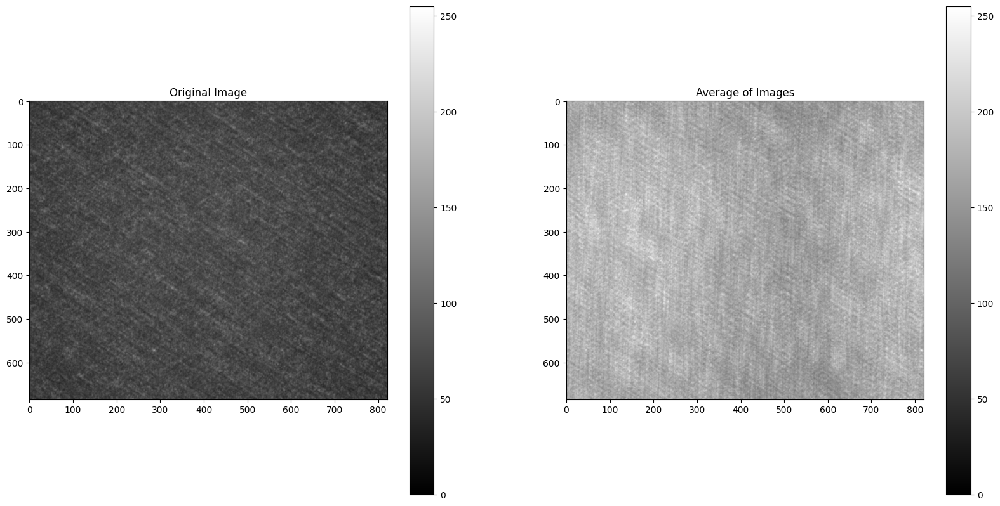

Image successfully saved to /Users/qingjunwang/Documents/image files/laser driving simulation/ePIC_FL2_20um_r0.05_z2mm_DOE5_300points_90um_contrast0.0906122244335576.png


In [23]:
#small image:
path='/Users/qingjunwang/Documents/image files/speckle 2 study/yuhang/YSSI_P20(XP10_YP20)_rSD_Green_single_image_folder/EPIC_FL2_D12C5_YSSI_P20_rSD_Green_50mA_25degrees_X0.000_Y0.000_Z33.606_Exp35938middle0.33.png'
dic_images_key_path={"ePIC_FL2_20um_r0.05_z2mm_DOE5":path}
amplitude_arr=[30,60,90]
image_pixel_per_um=2464 / 420 #chipview
select_color_chan=1
color='green'
img_save_path="/Users/qingjunwang/Documents/image files/laser driving simulation/"
crop_middle_third=0
anglearr=[[0.0, 4.800000000000001], [720.0, 724.8]]
contrast=shaking_scan_amplitude_laser_driving(dic_images_key_path, amplitude_arr, image_pixel_per_um, select_color_chan, color, img_save_path,crop_middle_third,anglearr)

In [ ]:
#small image:
path='/Users/qingjunwang/Documents/image files/speckle 2 study/yuhang/YSSI_P20(XP10_YP20)_rSD_Green_single_image_folder/EPIC_FL2_D12C5_YSSI_P20_rSD_Green_50mA_25degrees_X0.000_Y0.000_Z33.606_Exp35938middle0.33.png'
dic_images_key_path={"ePIC_FL2_20um_r0.05_z2mm_DOE5":path}
amplitude_arr=[30,60,90]
image_pixel_per_um=2464 / 420 #chipview
select_color_chan=1
color='green'
img_save_path="/Users/qingjunwang/Documents/image files/laser driving simulation/"
crop_middle_third=0
anglearr=[[0.0, 7.2], [1080.0, 1087.1999999999998]]
contrast=shaking_scan_amplitude_laser_driving(dic_images_key_path, amplitude_arr, image_pixel_per_um, select_color_chan, color, img_save_path,crop_middle_third,anglearr)

image loaded: ePIC_FL2_20um_r0.05_z2mm_DOE6
amp: 30 ,angle.min: 0.0 ,angle.max: 9.0 ,angle num: 2
finished one angle range
amp: 30 ,angle.min: 1440.0 ,angle.max: 1449.0 ,angle num: 2
finished one angle range
finished one angle array,for one amplitude
4


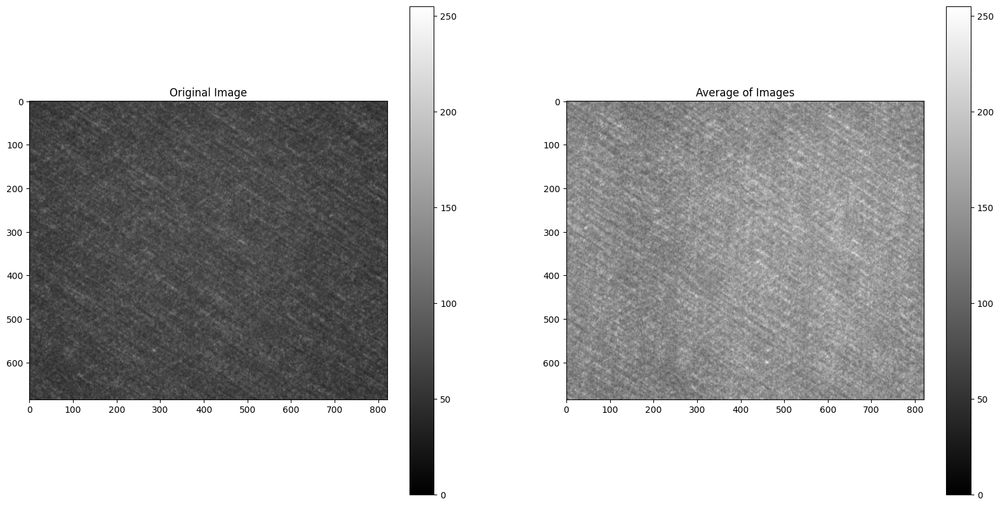

Image successfully saved to /Users/qingjunwang/Documents/image files/laser driving simulation/ePIC_FL2_20um_r0.05_z2mm_DOE6_100points_30um_contrast0.11808390373370144.png
amp: 60 ,angle.min: 0.0 ,angle.max: 9.0 ,angle num: 5
finished one angle range
amp: 60 ,angle.min: 1440.0 ,angle.max: 1449.0 ,angle num: 5
finished one angle range
finished one angle array,for one amplitude
10


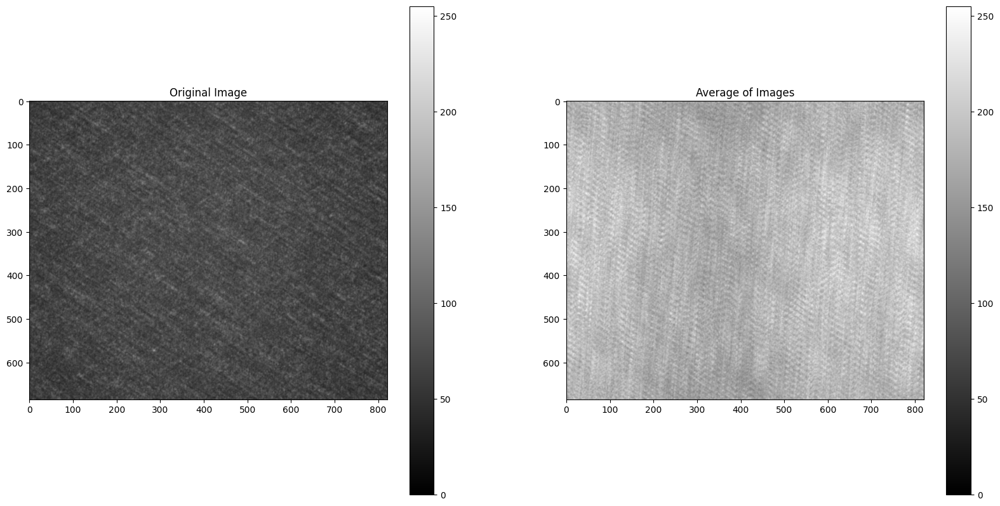

Image successfully saved to /Users/qingjunwang/Documents/image files/laser driving simulation/ePIC_FL2_20um_r0.05_z2mm_DOE6_200points_60um_contrast0.08662849081227353.png
amp: 90 ,angle.min: 0.0 ,angle.max: 9.0 ,angle num: 8
finished one angle range
amp: 90 ,angle.min: 1440.0 ,angle.max: 1449.0 ,angle num: 7
finished one angle range
finished one angle array,for one amplitude
15


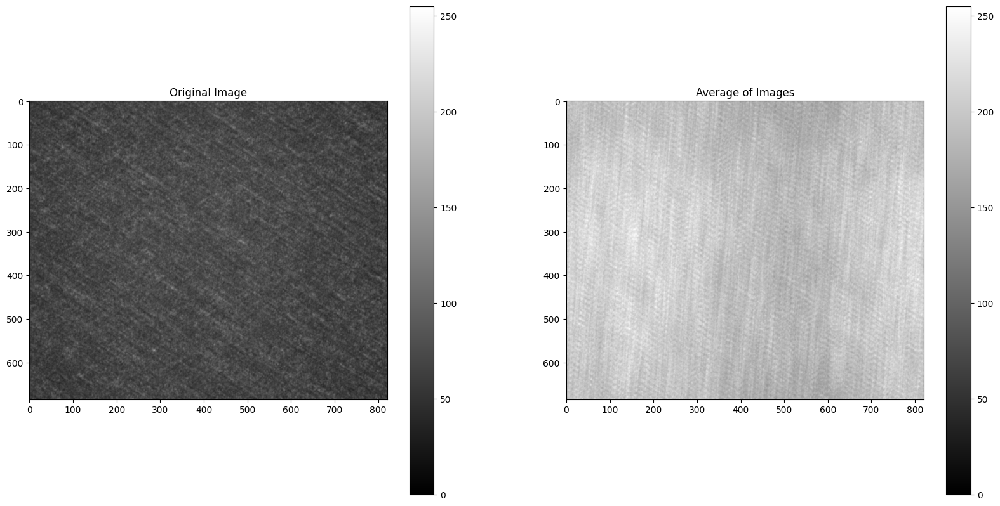

Image successfully saved to /Users/qingjunwang/Documents/image files/laser driving simulation/ePIC_FL2_20um_r0.05_z2mm_DOE6_300points_90um_contrast0.07351622970884078.png


In [24]:
#small image:
path='/Users/qingjunwang/Documents/image files/speckle 2 study/yuhang/YSSI_P20(XP10_YP20)_rSD_Green_single_image_folder/EPIC_FL2_D12C5_YSSI_P20_rSD_Green_50mA_25degrees_X0.000_Y0.000_Z33.606_Exp35938middle0.33.png'
dic_images_key_path={"ePIC_FL2_20um_r0.05_z2mm_DOE6":path}
amplitude_arr=[30,60,90]
image_pixel_per_um=2464 / 420 #chipview
select_color_chan=1
color='green'
img_save_path="/Users/qingjunwang/Documents/image files/laser driving simulation/"
crop_middle_third=0
anglearr=[[0.0, 9.600000000000001], [1440.0, 1449.6]]
contrast=shaking_scan_amplitude_laser_driving(dic_images_key_path, amplitude_arr, image_pixel_per_um, select_color_chan, color, img_save_path,crop_middle_third,anglearr)

image loaded: ePIC_FL2_20um_r0.05_z2mm_DOE7
amp: 30 ,angle.min: 0.0 ,angle.max: 12.0 ,angle num: 3
finished one angle range
amp: 30 ,angle.min: 1920.0 ,angle.max: 1932.0 ,angle num: 3
finished one angle range
finished one angle array,for one amplitude
6


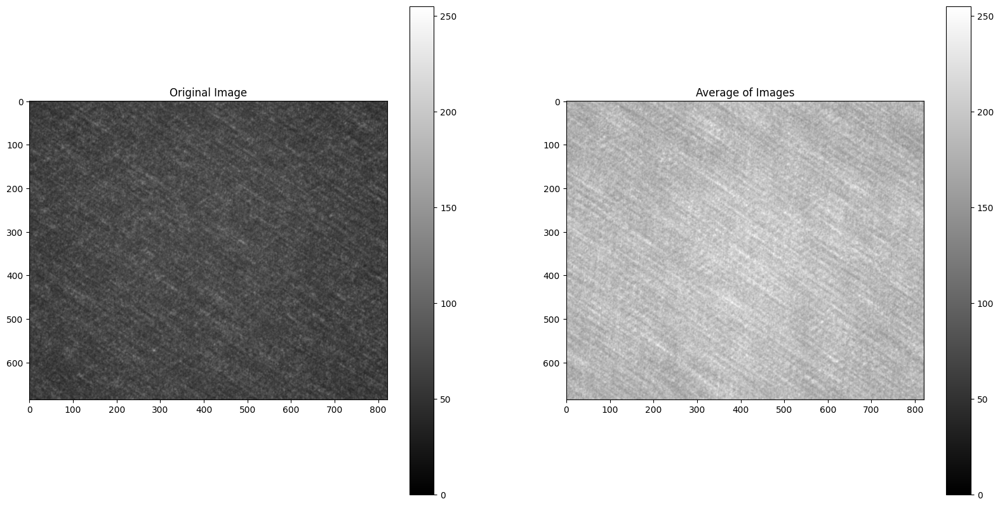

Image successfully saved to /Users/qingjunwang/Documents/image files/laser driving simulation/ePIC_FL2_20um_r0.05_z2mm_DOE7_100points_30um_contrast0.07176675150628373.png
amp: 60 ,angle.min: 0.0 ,angle.max: 12.0 ,angle num: 7
finished one angle range
amp: 60 ,angle.min: 1920.0 ,angle.max: 1932.0 ,angle num: 7
finished one angle range
finished one angle array,for one amplitude
14


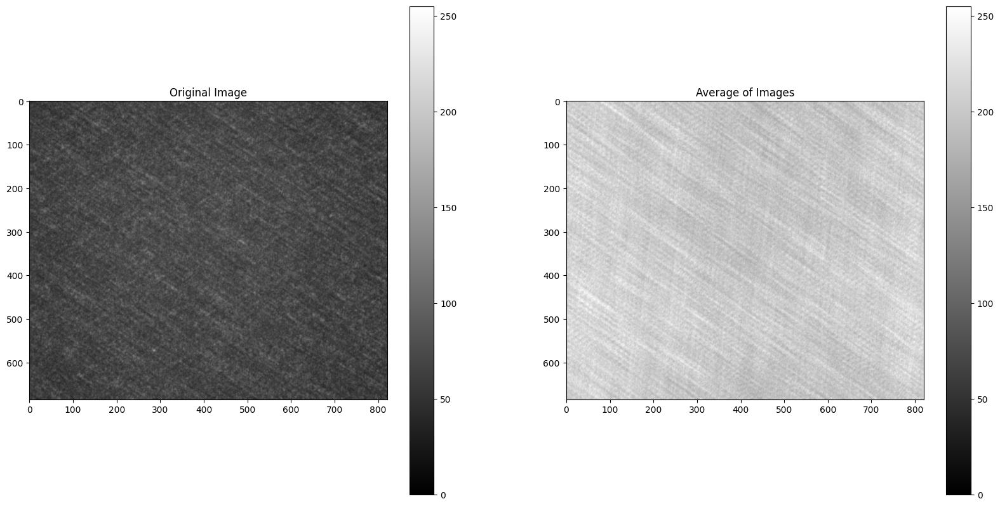

Image successfully saved to /Users/qingjunwang/Documents/image files/laser driving simulation/ePIC_FL2_20um_r0.05_z2mm_DOE7_200points_60um_contrast0.05300466854899223.png
amp: 90 ,angle.min: 0.0 ,angle.max: 12.0 ,angle num: 10
finished one angle range
amp: 90 ,angle.min: 1920.0 ,angle.max: 1932.0 ,angle num: 10
finished one angle range
finished one angle array,for one amplitude
20


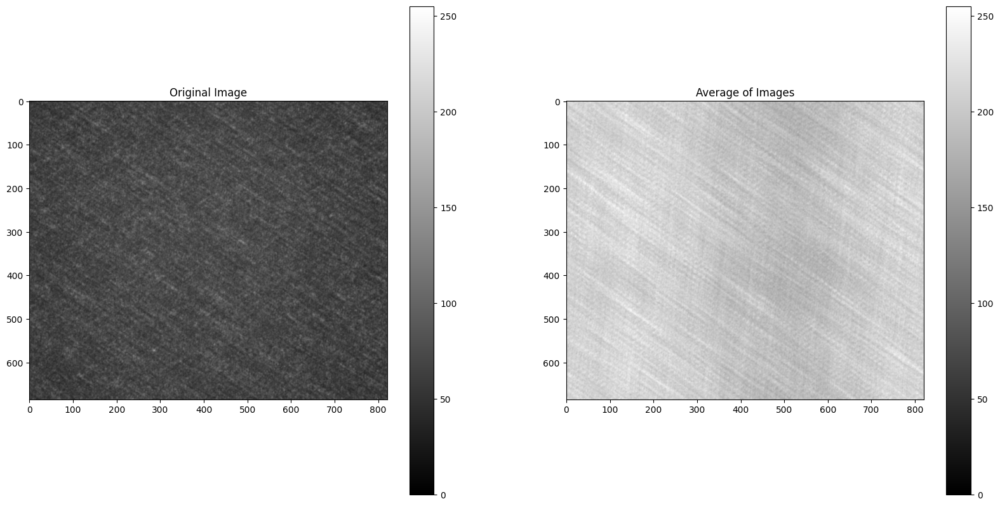

Image successfully saved to /Users/qingjunwang/Documents/image files/laser driving simulation/ePIC_FL2_20um_r0.05_z2mm_DOE7_300points_90um_contrast0.06225013708487106.png


In [25]:
#small image:
path='/Users/qingjunwang/Documents/image files/speckle 2 study/yuhang/YSSI_P20(XP10_YP20)_rSD_Green_single_image_folder/EPIC_FL2_D12C5_YSSI_P20_rSD_Green_50mA_25degrees_X0.000_Y0.000_Z33.606_Exp35938middle0.33.png'
dic_images_key_path={"ePIC_FL2_20um_r0.05_z2mm_DOE7":path}
amplitude_arr=[30,60,90]
image_pixel_per_um=2464 / 420 #chipview
select_color_chan=1
color='green'
img_save_path="/Users/qingjunwang/Documents/image files/laser driving simulation/"
crop_middle_third=0
anglearr=[[0.0, 12.8], [1920.0, 1932.8]]
contrast=shaking_scan_amplitude_laser_driving(dic_images_key_path, amplitude_arr, image_pixel_per_um, select_color_chan, color, img_save_path,crop_middle_third,anglearr)

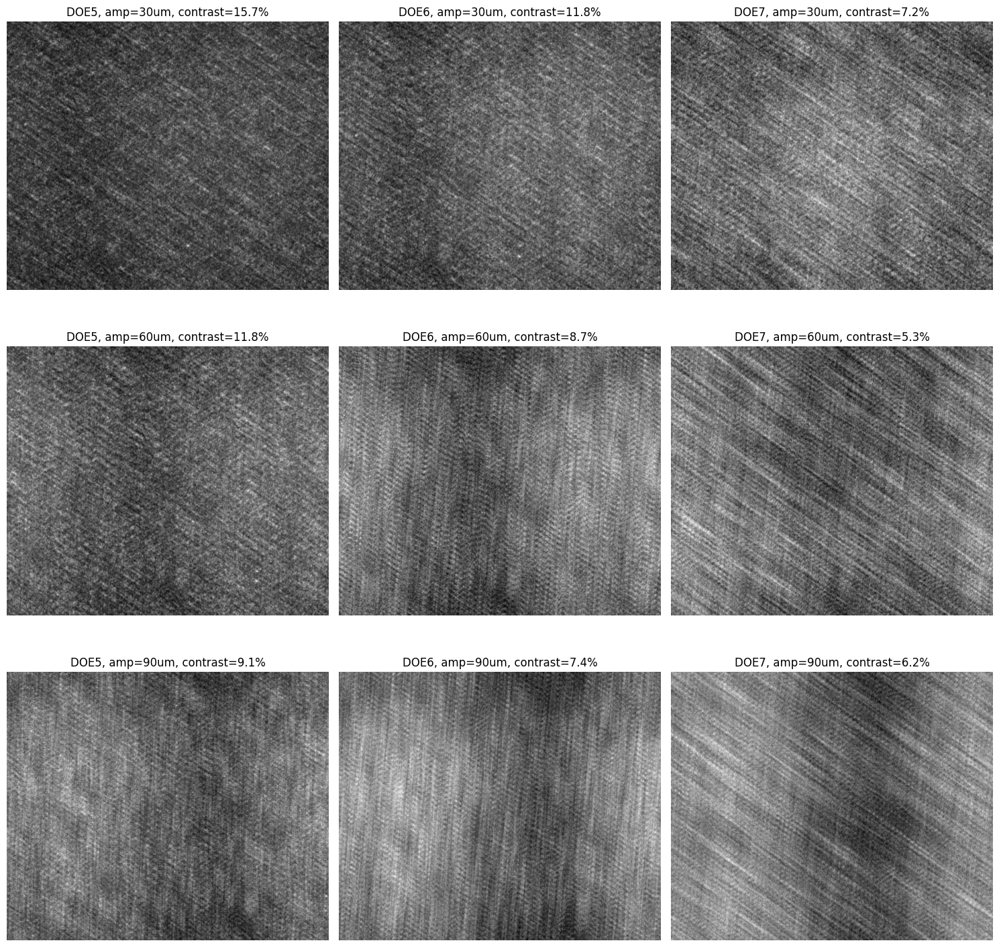

In [77]:
folder_path = '/Users/qingjunwang/Documents/image files/laser driving simulation/doe5-7'
images = load_images_from_folder(folder_path)
normalized_images = normalize_images(images)
folder_path2 = '/Users/qingjunwang/Documents/image files/laser driving simulation/doe5-7'
save_normalized_images(normalized_images, folder_path2)  # Save each normalized image
plot_images(normalized_images)

# DOE 8-11 2% mode2 image for different cycles

```python
DOE 8-11 compared to DOE1-4, the most important information is how many pulse sampling we get, 
Then evenly distrobute the pulses for CW simulation

Assumption: 
use 100ns laser on to have more sampling
eye integration time=1/60Hz=0.0167s

one color frame single color laser time=1/90/3=0.004s
consider a=2% laser turn on time: 0.004*0.02=8*10^-5s
num of pulses for one color frame single color laser time: 8*10^-5/(100*10^-9)=800

in laser all-on simulation, we use 3.3 points along trajectory for each 1um in shaking amplitude, 
(A100um use 300points) (see the converge test in the following image:)
800 sampling is more than enough for less than 2 mechanical shaking cycles, and we can treat this as CW case like what we considered in DOE1 and DOE2
```

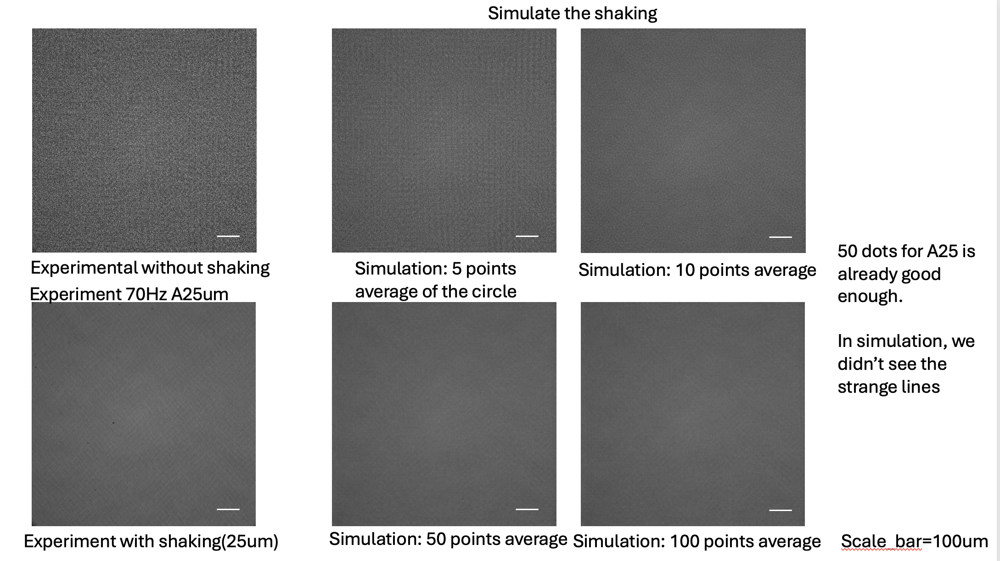

In [116]:
display(Image(filename='/Users/qingjunwang/Documents/screenshots/sampling threshhold.png', width=500, height=300))